#Face Recognition
Many classes, but very few examples for each class- use
Triplet loss and Contrastive loss




#Defining and implementing our Dataset class

In [89]:

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [64]:
DATA_DIR = '/content/drive/My Drive/face recognition/train images/'

In [65]:
VALIDATION_DIR = '/content/drive/My Drive/face recognition/validation images/'

In [66]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import sys

# Constants

sz = 96
batch_size = 16
embed_size = 512
num_epochs = 10

#Dataset
In many problems, we need to define our own Dataset class. To define a new Dataset, you should:
Create a subclass of torch.utils.data.Dataset Override the following three methods: The constructor or init(): this method is required to initialize the dataset object. The getitem() method: this methos enables us to access each training data using its index. In other words, we can use the dataset as a simple list or sequence. The len() method: this method returns number of data in the dataset.

In [67]:

# Define your TripletDataset class
class TripletDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = []
        self.labels = []

        for label, sub_dir in enumerate(os.listdir(root_dir)):
            for image_name in os.listdir(os.path.join(root_dir, sub_dir)):
                image_path = os.path.join(root_dir, sub_dir, image_name)
                self.image_paths.append(image_path)
                self.labels.append(label)

    def __getitem__(self, index):
        anchor_path = self.image_paths[index]
        anchor_label = self.labels[index]

        positive_indices = [i for i, label in enumerate(self.labels) if label == anchor_label]
        positive_index = random.choice(positive_indices)
        positive_path = self.image_paths[positive_index]

        negative_indices = [i for i, label in enumerate(self.labels) if label != anchor_label]
        negative_index = random.choice(negative_indices)
        negative_path = self.image_paths[negative_index]

        anchor_image = Image.open(anchor_path).convert('RGB')
        positive_image = Image.open(positive_path).convert('RGB')
        negative_image = Image.open(negative_path).convert('RGB')

        if self.transform is not None:
            anchor_image = self.transform(anchor_image)
            positive_image = self.transform(positive_image)
            negative_image = self.transform(negative_image)

        return anchor_image, positive_image, negative_image

    def __len__(self):
        return len(self.image_paths)


In [68]:

# Define your TripletLoss class
class TripletLoss(nn.Module):
    def __init__(self, margin=0.2):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        pos_distance = torch.sum((anchor - positive) ** 2, dim=1)
        neg_distance = torch.sum((anchor - negative) ** 2, dim=1)
        loss = torch.relu(pos_distance - neg_distance + self.margin)
        return loss.mean()


#data agmuntation:
zoom = int((1.0 + random.random() / 10.0) * sz) # up to 10 percent zoom

tfms = transforms.Compose

transforms.Resize((zoom, zoom)),

transforms.RandomCrop(sz),

transforms.RandomHorizontalFlip(),

transforms.RandomRotation(5),

transforms.ToTensor()

In [69]:

# Data transformations for training and validation
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(sz),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])

valid_transform = transforms.Compose([
    transforms.Resize((sz, sz)),
    transforms.ToTensor(),
])


In [70]:

# Create training dataset and data loader
train_dataset = TripletDataset(DATA_DIR, transform=train_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [71]:

# Create validation dataset and data loader
valid_dataset = TripletDataset(VALIDATION_DIR, transform=valid_transform)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=4)


In [72]:

# Load a pre-trained CNN model
model = torch.hub.load('pytorch/vision:v0.9.0', 'resnet50', pretrained=True)
num_features = model.fc.in_features

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.9.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [73]:

# Modify the fully connected layer for embedding
model.fc = nn.Sequential(
    nn.Linear(num_features, 512),
    nn.BatchNorm1d(512),
    nn.ReLU(),
    nn.Linear(512, embed_size)
)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)



In [74]:
def validate(model, valid_loader, criterion, device):
    model.eval()
    running_loss = 0.0

    with torch.no_grad():
        for anchor, positive, negative in valid_loader:
            anchor, positive, negative = anchor.to(device), positive.to(device), negative.to(device)

            anchor_output = model(anchor)
            positive_output = model(positive)
            negative_output = model(negative)

            loss = criterion(anchor_output, positive_output, negative_output)
            running_loss += loss.item()

    return running_loss / len(valid_loader)


In [75]:

# Loss and optimizer
criterion = TripletLoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0002)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

In [76]:
import matplotlib.pyplot as plt
import torchvision



In [77]:

def visualize_triplet_batch(anchors, positives, negatives, nrow=8):
    batch_size = anchors.size(0)
    concat = torch.cat((anchors, positives, negatives), 0)
    grid = torchvision.utils.make_grid(concat, nrow=nrow)

    # Convert the tensor to a numpy array
    img_grid = grid.permute(1, 2, 0).cpu().numpy()

    # Display the image grid
    plt.figure(figsize=(24, 9))
    plt.imshow(img_grid)
    plt.axis('off')
    plt.show()


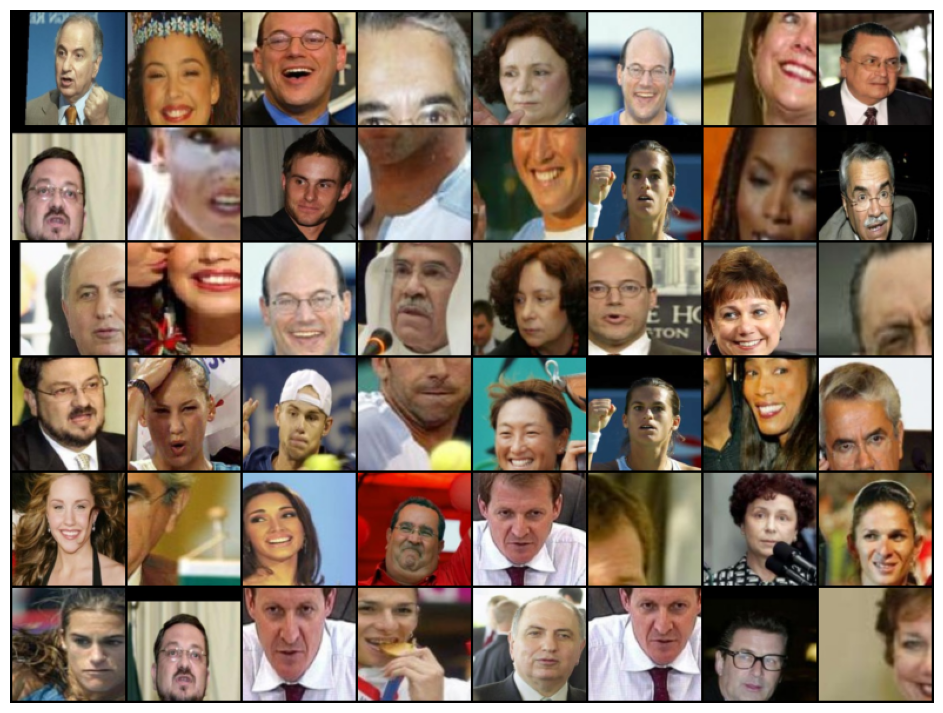

In [28]:
# Example usage:
anch_imgs, pos_imgs, neg_imgs = next(iter(train_loader))
concat = torch.cat((anch_imgs, pos_imgs, neg_imgs), 0)
plt.figure(figsize=(24, 9))
plt.imshow(torchvision.utils.make_grid(concat, nrow=8).permute(1, 2, 0))
plt.axis('off')
plt.show()


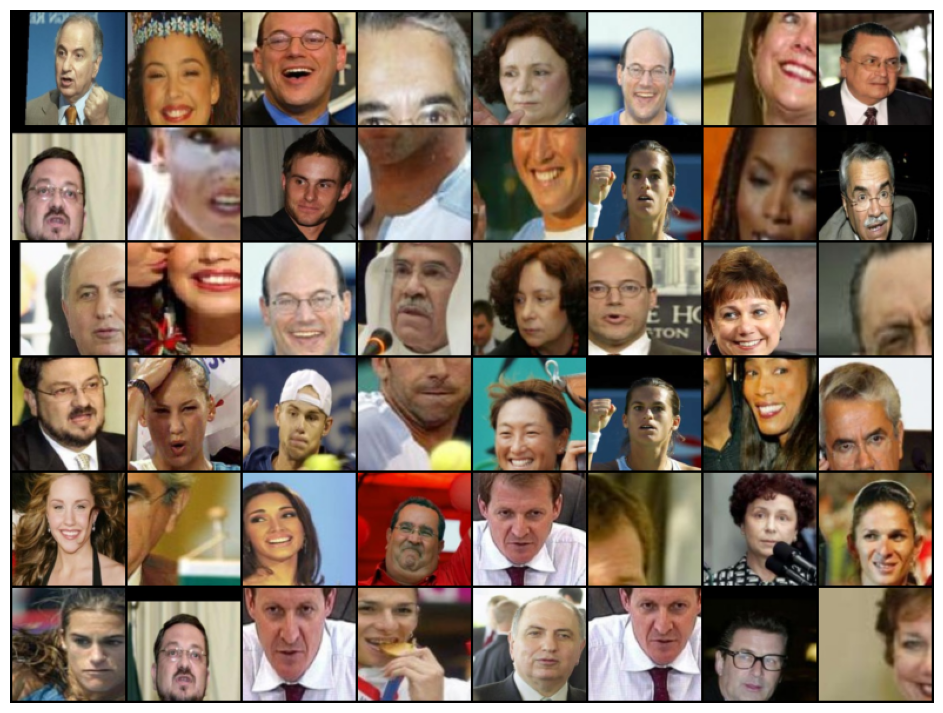

In [29]:
concat_grid = torchvision.utils.make_grid(concat, nrow=8).permute(1, 2, 0)
plt.figure(figsize=(24, 9))
plt.imshow(concat_grid)
plt.axis('off')
plt.show()


In [20]:


# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for anchor, positive, negative in train_loader:
        optimizer.zero_grad()
        anchor, positive, negative = anchor.to(device), positive.to(device), negative.to(device)

        anchor_output = model(anchor)
        positive_output = model(positive)
        negative_output = model(negative)

        loss = criterion(anchor_output, positive_output, negative_output)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {running_loss / len(train_loader)}')

    # Call the validate function to monitor validation loss
    validation_loss = validate(model, valid_loader, criterion, device)
    print(f'Validation Loss: {validation_loss}')

print('Finished Training')


Epoch 1/10, Loss: 7.647983646392822
Validation Loss: 6.003473520278931
Epoch 2/10, Loss: 6.545212322473526
Validation Loss: 1.9100803017616272
Epoch 3/10, Loss: 5.568166053295135
Validation Loss: 2.4869222164154055
Epoch 4/10, Loss: 5.693332368135453
Validation Loss: 3.3145390421152117
Epoch 5/10, Loss: 5.567909604310989
Validation Loss: 2.6443494141101835
Epoch 6/10, Loss: 4.698047861456871
Validation Loss: 3.7730556964874267
Epoch 7/10, Loss: 5.076957812905311
Validation Loss: 3.723300552368164
Epoch 8/10, Loss: 3.7980905033648016
Validation Loss: 1.80291306078434
Epoch 9/10, Loss: 2.934373817592859
Validation Loss: 1.3162872314453125
Epoch 10/10, Loss: 1.6369803816080093
Validation Loss: 1.0321020126342773
Finished Training


In [21]:
import matplotlib.pyplot as plt

Epoch 1/10, Loss: 2.450082624703646
Validation Loss: 1.4157231807708741
Epoch 2/10, Loss: 2.1624284982681274
Validation Loss: 2.4381303071975706
Epoch 3/10, Loss: 1.4112127222120763
Validation Loss: 1.2122467756271362
Epoch 4/10, Loss: 0.8297589395195246
Validation Loss: 1.0430374056100846
Epoch 5/10, Loss: 1.0577632360160352
Validation Loss: 1.2169910095632077
Epoch 6/10, Loss: 1.1317848404869437
Validation Loss: 0.5664704725146293
Epoch 7/10, Loss: 0.9528849646449089
Validation Loss: 0.7427877336740494
Epoch 8/10, Loss: 0.9732212773058564
Validation Loss: 0.6239264249801636
Epoch 9/10, Loss: 1.4553091807290912
Validation Loss: 1.050833049416542
Epoch 10/10, Loss: 0.6523585207760334
Validation Loss: 0.3153813362121582
Finished Training


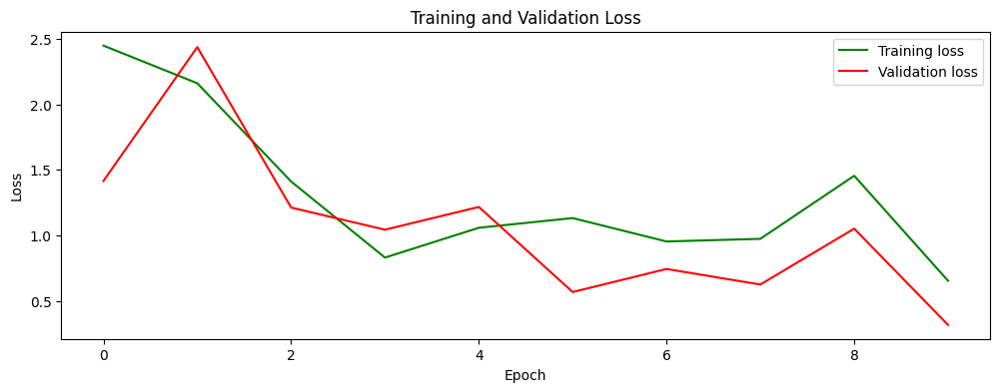

In [23]:
import matplotlib.pyplot as plt

# Initialize lists to store training and validation losses
train_losses = []
valid_losses = []

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for anchor, positive, negative in train_loader:
        optimizer.zero_grad()
        anchor, positive, negative = anchor.to(device), positive.to(device), negative.to(device)

        anchor_output = model(anchor)
        positive_output = model(positive)
        negative_output = model(negative)

        loss = criterion(anchor_output, positive_output, negative_output)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {running_loss / len(train_loader)}')
    train_losses.append(running_loss / len(train_loader))

    # Call the validate function to monitor validation loss
    validation_loss = validate(model, valid_loader, criterion, device)
    print(f'Validation Loss: {validation_loss}')
    valid_losses.append(validation_loss)

print('Finished Training')

# Plot training and validation loss
plt.figure(figsize=(12, 4))
plt.plot(train_losses, 'g', label='Training loss')
plt.plot(valid_losses, 'r', label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss")
plt.show()


#provided additional code for a custom training loop, train_step, validate_step, and a train function

###The choice between using a custom training loop and a pre-built training loop like the one provided earlier in your code depends on various factors, including your specific requirements and preferences.  the differences and considerations for each approach:

Custom Training Loop (Provided Additional Code):

Pros:

Flexibility: You have complete control over the training process, allowing you to implement custom logic, metrics, and reporting.
Fine-Grained Control: You can adjust various parameters and hyperparameters during training, such as learning rate schedules, gradient clipping, etc.
Debugging: Easier to debug and customize since you can inspect and modify each training step.

Cons:

Complexity: Requires more lines of code and understanding of the training process, which might be challenging for beginners.
Time-Consuming: Building and testing a custom training loop can be time-consuming.
Error-Prone: Greater potential for bugs and mistakes, especially if not implemented correctly.


Pre-built Training Loop (Provided Earlier):

Pros:
Ease of Use: Simplicity and ease of use, especially for beginners or when prototyping.
Stability: Less likely to introduce errors and issues related to the training loop itself.
Consistency: Can rely on well-tested libraries like PyTorch's built-in training loops.

Cons:
Less Customization: Limited flexibility for implementing highly customized training logic.
Limited Control: Less control over fine-grained training parameters unless you modify the provided code.
Not Suitable for All Cases: May not suit specialized training procedures, such as GAN training, custom loss functions, etc.

Regarding reliability and accuracy, the reliability of either approach depends more on the correctness of your implementation and the suitability of your model architecture and hyperparameters for the specific task. If both approaches are implemented correctly, they should produce similar results in terms of accuracy.

In practice, it's common to start with a pre-built training loop for simplicity and ease of use. If you encounter specific requirements or issues that cannot be addressed with the pre-built loop, then you might consider transitioning to a custom training loop.

In [79]:
"""import torchvision.models as models

def get_model(model_name):
    if model_name == 'resnet50':
        return models.resnet18(pretrained=True)
    elif model_name == 'vgg16':
        return models.vgg16(pretrained=True)
    else:
        raise ValueError("Unsupported model name")

# Example usage:
cnn_name = 'resnet50'  # You can change this to the CNN architecture you want to use
cnn = get_model(cnn_name)
"""

'import torchvision.models as models\n\ndef get_model(model_name):\n    if model_name == \'resnet50\':\n        return models.resnet18(pretrained=True)\n    elif model_name == \'vgg16\':\n        return models.vgg16(pretrained=True)\n    else:\n        raise ValueError("Unsupported model name")\n\n# Example usage:\ncnn_name = \'resnet50\'  # You can change this to the CNN architecture you want to use\ncnn = get_model(cnn_name)\n'

In [80]:
"""import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import sys

# Define your model architecture here
class TripletNetwork(nn.Module):
    def __init__(self, cnn, embed_size):
        super(TripletNetwork, self).__init__()
        self.cnn = cnn  # Your base CNN model
        self.embed_size = embed_size

        # Define layers for embedding
        self.fc1 = nn.Linear(embed_size, 512)
        self.fc2 = nn.Linear(512, embed_size)

    def forward(self, anchor, positive, negative):
        # Forward pass for anchor, positive, and negative samples
        anchor_emb = self.embed(anchor)
        positive_emb = self.embed(positive)
        negative_emb = self.embed(negative)

        return anchor_emb, positive_emb, negative_emb

    def embed(self, x):
        # Embedding layers
        x = self.cnn(x)
        x = x.view(x.size()[0], -1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x
"""

'import torch\nimport torch.nn as nn\nimport torch.optim as optim\nfrom torch.utils.data import DataLoader\nimport sys\n\n# Define your model architecture here\nclass TripletNetwork(nn.Module):\n    def __init__(self, cnn, embed_size):\n        super(TripletNetwork, self).__init__()\n        self.cnn = cnn  # Your base CNN model\n        self.embed_size = embed_size\n        \n        # Define layers for embedding\n        self.fc1 = nn.Linear(embed_size, 512)\n        self.fc2 = nn.Linear(512, embed_size)\n    \n    def forward(self, anchor, positive, negative):\n        # Forward pass for anchor, positive, and negative samples\n        anchor_emb = self.embed(anchor)\n        positive_emb = self.embed(positive)\n        negative_emb = self.embed(negative)\n        \n        return anchor_emb, positive_emb, negative_emb\n    \n    def embed(self, x):\n        # Embedding layers\n        x = self.cnn(x)\n        x = x.view(x.size()[0], -1)\n        x = torch.relu(self.fc1(x))\n        

In [81]:
"""# Define your TripletLoss function here (if not already defined)
class TripletLoss(nn.Module):
    def __init__(self, margin=1.0):
        super(TripletLoss, self).__init__()
        self.margin = margin

    def forward(self, anchor, positive, negative):
        # Compute triplet loss
        distance_positive = torch.norm(anchor - positive, dim=1)
        distance_negative = torch.norm(anchor - negative, dim=1)
        losses = torch.relu(distance_positive - distance_negative + self.margin)
        return torch.mean(losses)
"""

'# Define your TripletLoss function here (if not already defined)\nclass TripletLoss(nn.Module):\n    def __init__(self, margin=1.0):\n        super(TripletLoss, self).__init__()\n        self.margin = margin\n\n    def forward(self, anchor, positive, negative):\n        # Compute triplet loss\n        distance_positive = torch.norm(anchor - positive, dim=1)\n        distance_negative = torch.norm(anchor - negative, dim=1)\n        losses = torch.relu(distance_positive - distance_negative + self.margin)\n        return torch.mean(losses)\n'

In [82]:
"""import torch
import sys

def train(model, train_dl, valid_dl, criterion, optimizer, device, scheduler=None, num_epochs=10):
    best_loss = float('inf')
    best_weights = model.state_dict().copy()

    train_loss_history, valid_loss_history = [], []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}\n--------')

        model.train()
        N = len(train_dl.dataset)
        steps = N // train_dl.batch_size
        avg_loss = 0.0

        for i, (anc, pos, neg) in enumerate(train_dl):
            anc, pos, neg = anc.to(device), pos.to(device), neg.to(device)

            # forward
            f_anc, f_pos, f_neg = model(anc, pos, neg)

            # loss
            loss = criterion(f_anc, f_pos, f_neg)
            avg_loss = (avg_loss * i + loss.item()) / (i + 1)

            # backward
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # report
            sys.stdout.flush()
            sys.stdout.write("\r Training Step [{:2d}/{:2d}]: loss {:.5f}  ".format(i+1, steps, avg_loss))

        print()

        # Call the validate function to monitor validation loss
        validation_loss = validate(model, valid_dl, criterion, device)
        print(f'Validation Loss: {validation_loss}')

        if scheduler:
            scheduler.step()

        train_loss_history.append(avg_loss)
        valid_loss_history.append(validation_loss)

        if validation_loss < best_loss:
            best_loss = validation_loss
            best_weights = model.state_dict().copy()

    loss_history = (train_loss_history, valid_loss_history)
    model.load_state_dict(best_weights)

    return model, best_weights, loss_history
"""

'import torch\nimport sys\n\ndef train(model, train_dl, valid_dl, criterion, optimizer, device, scheduler=None, num_epochs=10):\n    best_loss = float(\'inf\')\n    best_weights = model.state_dict().copy()\n    \n    train_loss_history, valid_loss_history = [], []\n    \n    for epoch in range(num_epochs):\n        print(f\'Epoch {epoch + 1}\n--------\') \n        \n        model.train()\n        N = len(train_dl.dataset)\n        steps = N // train_dl.batch_size\n        avg_loss = 0.0\n        \n        for i, (anc, pos, neg) in enumerate(train_dl):\n            anc, pos, neg = anc.to(device), pos.to(device), neg.to(device)\n\n            # forward\n            f_anc, f_pos, f_neg = model(anc, pos, neg)\n\n            # loss\n            loss = criterion(f_anc, f_pos, f_neg)\n            avg_loss = (avg_loss * i + loss.item()) / (i + 1)\n\n            # backward\n            optimizer.zero_grad()\n            loss.backward()\n            optimizer.step()\n\n            # report\n    

In [83]:
"""from torchsummary import summary

# Replace with the actual dimensions of your input data
channels = 3  # Number of color channels (e.g., 3 for RGB)
height = 224  # Height of input images
width = 224   # Width of input images
summary(model, input_size=(channels, height, width))
"""

'from torchsummary import summary\n\n# Replace with the actual dimensions of your input data\nchannels = 3  # Number of color channels (e.g., 3 for RGB)\nheight = 224  # Height of input images\nwidth = 224   # Width of input images\nsummary(model, input_size=(channels, height, width))\n'

In [84]:
"""# Import necessary libraries
import sys
import torch.optim as optim

# Initialize your model, loss function, optimizer, and scheduler
# Set hyperparameters
num_epochs = 10
learning_rate = 0.0002

# Initialize your model, loss function, optimizer, and scheduler
cnn_name = 'resnet50'  # You can change this to the CNN architecture you want to use
cnn = get_model(cnn_name)  # Replace with your model loading code
embed_size = 128  # Adjust as needed
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


criterion = TripletLoss().to(device)
optimizer = optim.Adam(model.parameters(), lr=0.0002)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)


# Custom training loop
def train(model, train_loader, valid_loader, criterion, optimizer, device, scheduler=None, num_epochs=10):
    best_loss = float('inf')
    best_weights = model.state_dict().copy()

    train_loss_history, valid_loss_history = [], []

    for epoch in range(num_epochs):
        print(f'Epoch {epoch + 1}\n--------')

        model.train()
        N = len(train_loader.dataset)
        steps = N // train_loader.batch_size
        avg_loss = 0.0

        for i, (anc, pos, neg) in enumerate(train_loader):
            anc, pos, neg = anc.to(device), pos.to(device), neg.to(device)

            # Forward pass
            f_anc, f_pos, f_neg = model(anc, pos, neg)

            # Calculate loss
            loss = criterion(f_anc, f_pos, f_neg)
            avg_loss = (avg_loss * i + loss.item()) / (i + 1)

            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Report
            sys.stdout.flush()
            sys.stdout.write("\r Training Step [{:2d}/{:2d}]: loss {:.5f}  ".format(i+1, steps, avg_loss))

        print()

        # Call the validate function to monitor validation loss
        validation_loss = validate(model, valid_loader, criterion, device)
        print(f'Validation Loss: {validation_loss}')

        if scheduler:
            scheduler.step()

        train_loss_history.append(avg_loss)
        valid_loss_history.append(validation_loss)

        if validation_loss < best_loss:
            best_loss = validation_loss
            best_weights = model.state_dict().copy()

    loss_history = (train_loss_history, valid_loss_history)
    model.load_state_dict(best_weights)

    return model, best_weights, loss_history


# Train your model using the custom training loop
#Call the train function with your data loaders and hyperparameters
model, best_weights, loss_history = train(
    model,
    train_loader,  # Use train_loader here
    valid_loader,  # Use valid_loader here
    criterion,
    optimizer,
    device,
    scheduler,
    num_epochs=num_epochs
)

# Plot training and validation loss
import matplotlib.pyplot as plt

train_loss_history, valid_loss_history = loss_history
plt.figure(figsize=(12, 4))
plt.plot(train_loss_history, 'g', label='Training loss')
plt.plot(valid_loss_history, 'r', label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss")
plt.show()
"""

'# Import necessary libraries\nimport sys\nimport torch.optim as optim\n\n# Initialize your model, loss function, optimizer, and scheduler\n# Set hyperparameters\nnum_epochs = 10\nlearning_rate = 0.0002\n\n# Initialize your model, loss function, optimizer, and scheduler\ncnn_name = \'resnet50\'  # You can change this to the CNN architecture you want to use\ncnn = get_model(cnn_name)  # Replace with your model loading code\nembed_size = 128  # Adjust as needed\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\n\n\ncriterion = TripletLoss().to(device)\noptimizer = optim.Adam(model.parameters(), lr=0.0002)\nscheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)\n\n\n# Custom training loop\ndef train(model, train_loader, valid_loader, criterion, optimizer, device, scheduler=None, num_epochs=10):\n    best_loss = float(\'inf\')\n    best_weights = model.state_dict().copy()\n    \n    train_loss_history, valid_loss_history = [], []\n    \n    for ep

# Testing

In [59]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [85]:
TEST_DIR = '/content/drive/My Drive/face recognition/test images/'

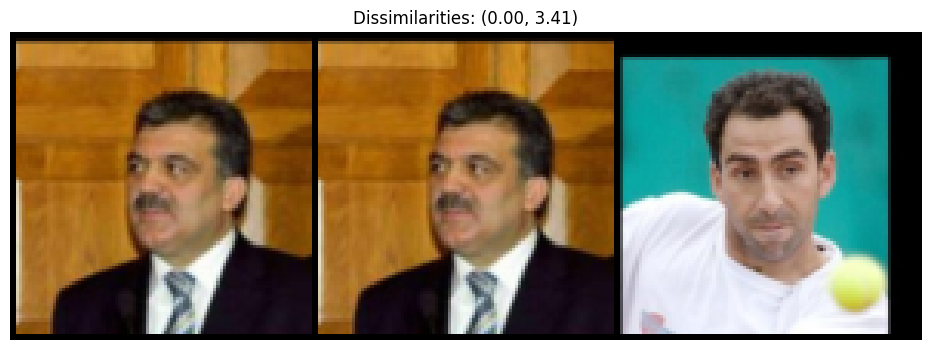

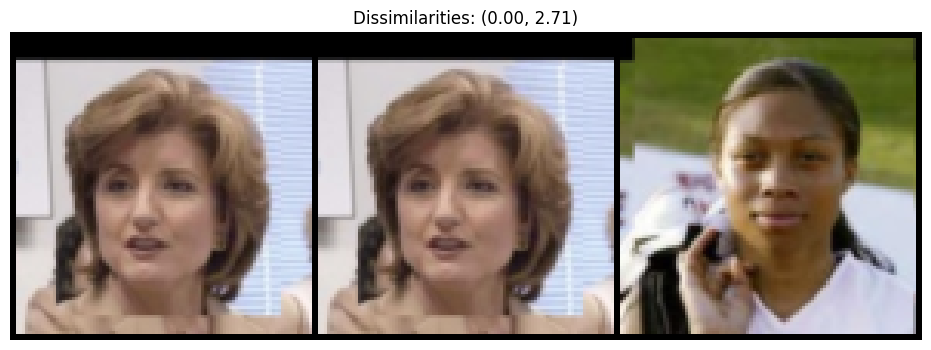

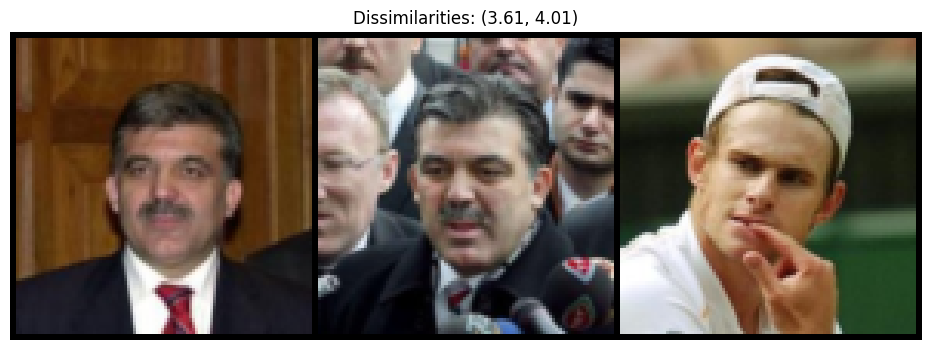

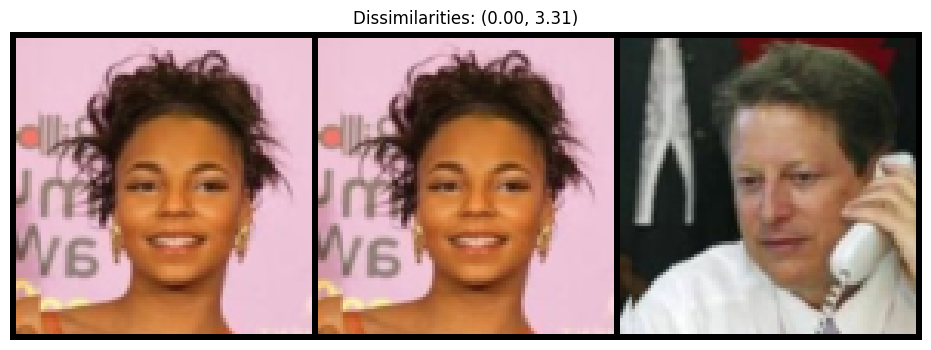

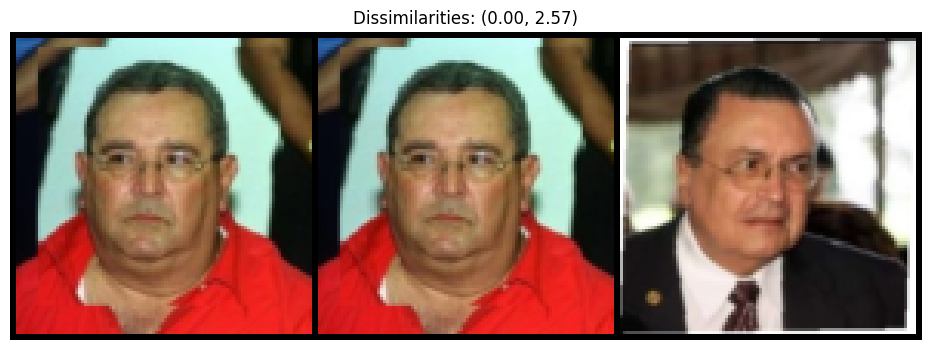

...

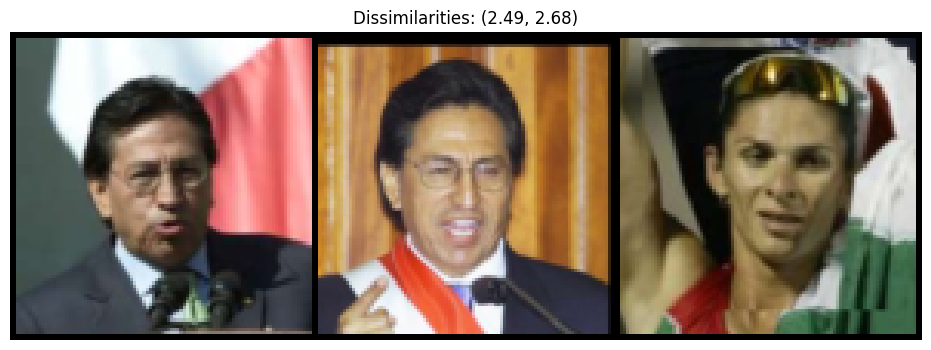

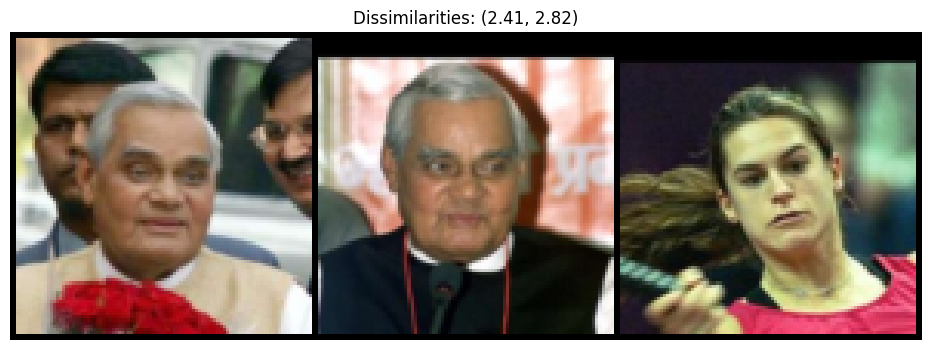

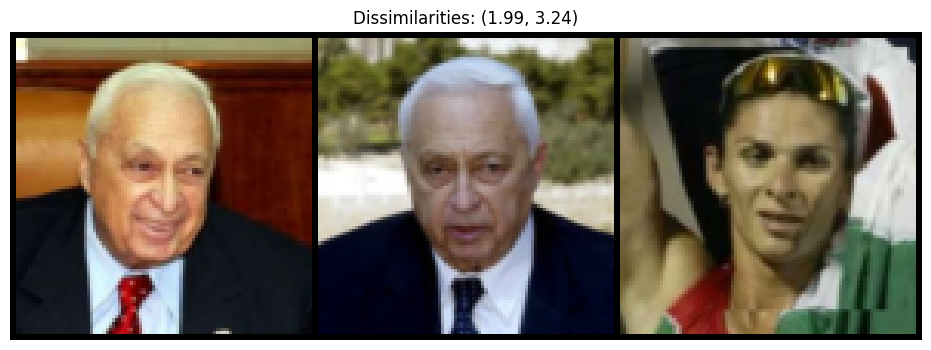

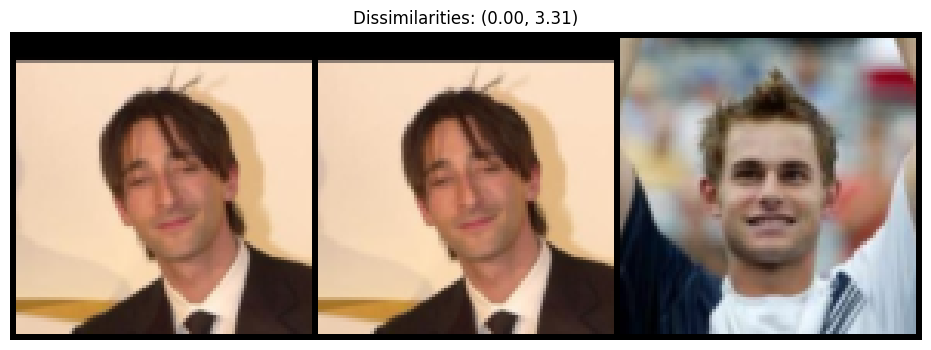

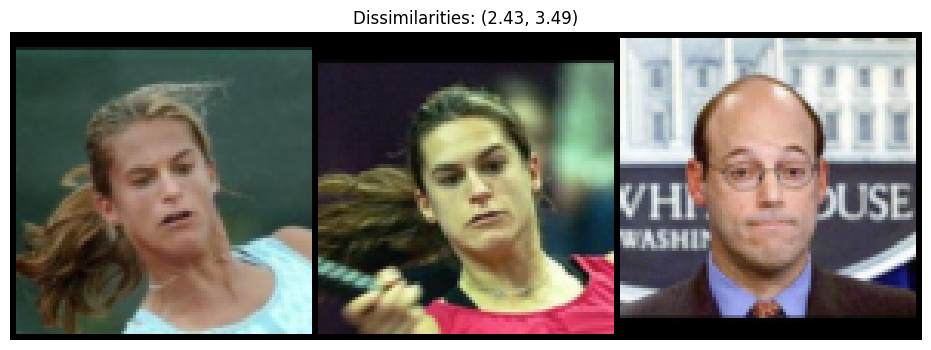

Pair 1: Dissimilarities - Positive: 0.00, Negative: 3.41
Pair 2: Dissimilarities - Positive: 0.00, Negative: 2.71
Pair 3: Dissimilarities - Positive: 3.61, Negative: 4.01
Pair 4: Dissimilarities - Positive: 0.00, Negative: 3.31
Pair 5: Dissimilarities - Positive: 0.00, Negative: 2.57
Pair 6: Dissimilarities - Positive: 0.00, Negative: 3.60
Pair 7: Dissimilarities - Positive: 0.00, Negative: 2.40
Pair 8: Dissimilarities - Positive: 2.85, Negative: 2.39
Pair 9: Dissimilarities - Positive: 0.00, Negative: 3.04
Pair 10: Dissimilarities - Positive: 0.00, Negative: 4.57
Pair 11: Dissimilarities - Positive: 3.04, Negative: 2.85
Pair 12: Dissimilarities - Positive: 3.19, Negative: 2.91
Pair 13: Dissimilarities - Positive: 3.94, Negative: 4.20
Pair 14: Dissimilarities - Positive: 3.48, Negative: 2.92
Pair 15: Dissimilarities - Positive: 2.61, Negative: 3.34
Pair 16: Dissimilarities - Positive: 3.26, Negative: 2.36
Pair 17: Dissimilarities - Positive: 0.00, Negative: 2.15
Pair 18: Dissimilaritie

In [88]:
import torch.nn.functional as F

# Put the model in evaluation mode
model.eval()

# Create a DataLoader for testing (assuming you have a TripletDataset for testing)
test_dataset = TripletDataset(TEST_DIR, transform=valid_transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=True)

# Initialize a function for plotting images and distances
def visualize_test_batch(anchor, positive, negative, pos_distance, neg_distance):
    concat = torch.cat((anchor, positive, negative), 0)
    grid = torchvision.utils.make_grid(concat)

    # Display the image grid with distances
    plt.figure(figsize=(12, 4))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title(f'Dissimilarities: ({pos_distance:.2f}, {neg_distance:.2f})')
    plt.show()

# Initialize a list to store dissimilarities
dissimilarities = []

# Test the model on the test dataset
with torch.no_grad():
    for i, (anchor, positive, negative) in enumerate(test_loader):
        anchor, positive, negative = anchor.to(device), positive.to(device), negative.to(device)

        # Forward pass through the model to obtain embeddings
        anchor_emb = model(anchor)
        positive_emb = model(positive)
        negative_emb = model(negative)

        # Calculate pairwise distances
        pos_distance = F.pairwise_distance(anchor_emb, positive_emb).item()
        neg_distance = F.pairwise_distance(anchor_emb, negative_emb).item()

        # Append the dissimilarities to the list
        dissimilarities.append((pos_distance, neg_distance))

        # Visualize the images and distances
        visualize_test_batch(anchor, positive, negative, pos_distance, neg_distance)

# Print the dissimilarities
for i, (pos_distance, neg_distance) in enumerate(dissimilarities):
    print(f"Pair {i + 1}: Dissimilarities - Positive: {pos_distance:.2f}, Negative: {neg_distance:.2f}")
